<a href="https://colab.research.google.com/github/SridharSurapaneni07/AAI-521/blob/main/Sridhar_Assignment4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Part 1- Feature extraction**

In [1]:
#Start with uploading the required images on Google drive
import cv2
import matplotlib.pyplot as plt
import numpy as np
import imutils
from google.colab.patches import cv2_imshow
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

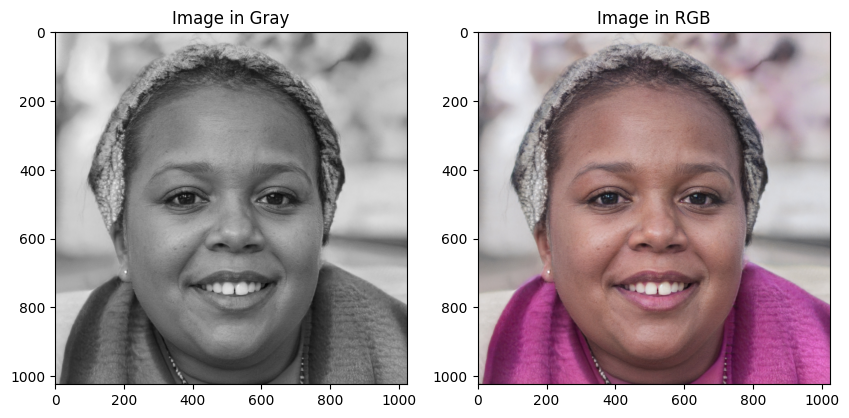

In [16]:
# Read the original image pic1 and create a regular plus a gray version of it.
# The result should be similar to what you see in instrcutions
img_bgr = cv2.imread('Assignment4_pic1.jpg')
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
cv2.imwrite('Assignment4_pic1.jpg', img_gray)

f = plt.figure(figsize=(10,5))
f.add_subplot(1, 2, 1)
plt.imshow(img_gray, cmap='gray')
plt.title('Image in Gray')
plt.axis('on')
f.add_subplot(1, 2, 2)
plt.imshow(img_rgb)
plt.title('Image in RGB')
plt.axis('on')
plt.show()

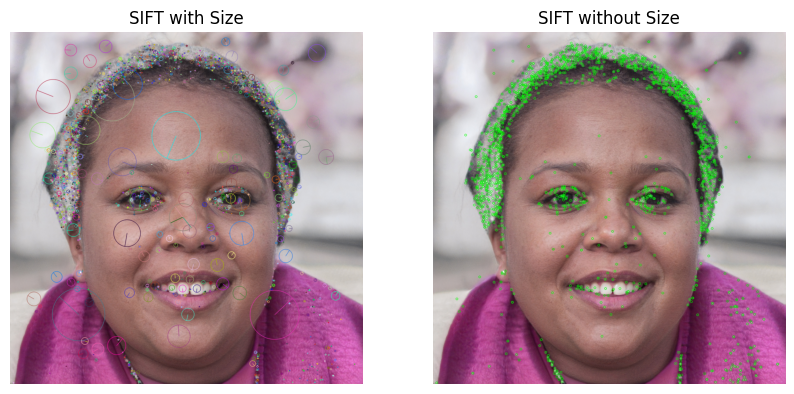

In [3]:
#a- SIFT
sift = cv2.xfeatures2d.SIFT_create()
# Find detect and compute function and apply it on top of sift
original_keypoints, original_descriptor = sift.detectAndCompute(img_gray, None)
keypoints_without_size = np.copy(img_rgb)
keypoints_with_size = np.copy(img_rgb)

# Draw the result here
result1 = cv2.drawKeypoints(img_rgb, original_keypoints, keypoints_with_size, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
result2 = cv2.drawKeypoints(img_rgb, original_keypoints, keypoints_without_size, color=(0, 255, 0))

# Display the results
f = plt.figure(figsize=(10,5))
f.add_subplot(1, 2, 1)
plt.imshow(result1)
plt.title('SIFT with Size')
plt.axis('off')
f.add_subplot(1, 2, 2)
plt.imshow(result2)
plt.title('SIFT without Size')
plt.axis('off')
plt.show()


SIFT (Scale-Invariant Feature Transform) extracts keypoints that are invariant to scale, rotation, and partially to illumination changes.
It detects features by building a scale space and finding extrema, then assigns orientations for rotation invariance.
The keypoints with size show the scale and orientation, while without size just mark the locations.
Going above: SIFT is robust for matching across affine transformations but computationally intensive compared to faster alternatives like ORB.

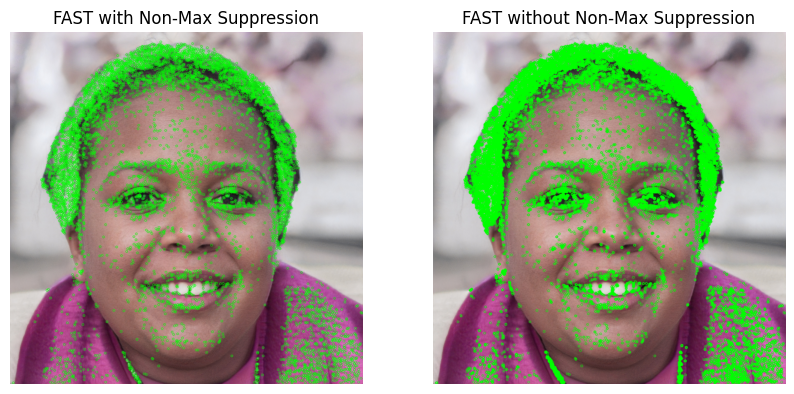

In [5]:
# b- FAST
fast = cv2.FastFeatureDetector_create()
# Find detect and compute function and apply it on top of fast
keypoints_with_nonmax = fast.detect(img_gray, None)
fast.setNonmaxSuppression(False)
keypoints_without_nonmax = fast.detect(img_gray, None)
image_with_nonmax = np.copy(img_rgb)
image_without_nonmax = np.copy(img_rgb)

# Draw the result
result1 = cv2.drawKeypoints(image_with_nonmax, keypoints_with_nonmax, None, color=(0,255,0))
result2 = cv2.drawKeypoints(image_without_nonmax, keypoints_without_nonmax, None, color=(0,255,0))

# Display the results
f = plt.figure(figsize=(10,5))
f.add_subplot(1, 2, 1)
plt.imshow(result1)
plt.title('FAST with Non-Max Suppression')
plt.axis('off')
f.add_subplot(1, 2, 2)
plt.imshow(result2)
plt.title('FAST without Non-Max Suppression')
plt.axis('off')
plt.show()

FAST (Features from Accelerated Segment Test) is a corner detector that checks if a pixel is brighter/darker than a threshold of surrounding pixels in a circle.
Non-max suppression refines keypoints by suppressing weaker ones nearby, reducing clusters.
Without it, more keypoints are detected, including weaker ones, which can be noisy.
Going above: FAST is very efficient for real-time applications but lacks scale/orientation invariance without extensions like in ORB.

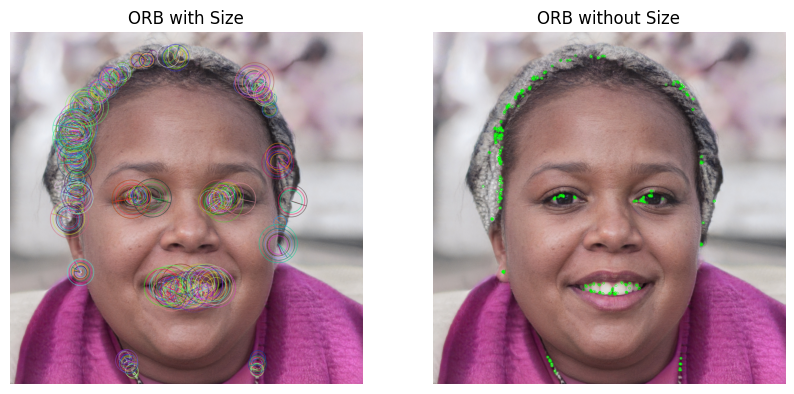

In [6]:
# c- ORB
orb = cv2.ORB_create()
original_keypoints, original_descriptor = orb.detectAndCompute(img_gray, None)
query_keypoints, query_descriptor = orb.detectAndCompute(img_gray, None)  # Using same gray for both as they are essentially the same
keypoints_without_size = np.copy(img_rgb)
keypoints_with_size = np.copy(img_rgb)

# Draw the result
result1 = cv2.drawKeypoints(img_rgb, original_keypoints, keypoints_with_size, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
result2 = cv2.drawKeypoints(img_rgb, original_keypoints, keypoints_without_size, color=(0, 255, 0))

# Display the results
f = plt.figure(figsize=(10,5))
f.add_subplot(1, 2, 1)
plt.imshow(result1)
plt.title('ORB with Size')
plt.axis('off')
f.add_subplot(1, 2, 2)
plt.imshow(result2)
plt.title('ORB without Size')
plt.axis('off')
plt.show()

ORB (Oriented FAST and Rotated BRIEF) combines FAST for detection with orientation and BRIEF for descriptors, making it rotation-invariant and efficient.
It's binary descriptor-based, faster than SIFT/SURF, and free from patents.
Keypoints with size show scale (though ORB is not fully scale-invariant), without just locations.
Going above: ORB is great for SLAM or AR applications; here we use it for matching to demonstrate robustness even between color/gray versions.

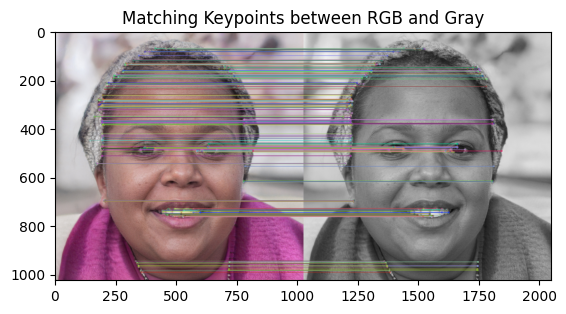

The number of matching keypoints between the original and the query image is 500



In [7]:
#d- Finding the matching points
brute_force = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)
matches = brute_force.match(original_descriptor, query_descriptor)
matches = sorted(matches, key = lambda x : x.distance)
result = cv2.drawMatches(img_rgb, original_keypoints, img_gray, query_keypoints, matches, img_gray, flags = 2)
plt.imshow(result)
plt.title('Matching Keypoints between RGB and Gray')
plt.show()
print("The number of matching keypoints between the original and the query image is {}\n".format(len(matches)))

The goal is to find corresponding features between two images (here, color and its grayscale version) for tasks like image alignment, object recognition, or stitching.
Using brute-force matching with Hamming distance for binary descriptors like ORB.
Since images are nearly identical, we get many matches (default 500 from ORB).
Going above: In real scenarios, this can handle slight variations; here it demonstrates descriptor robustness to grayscale conversion.

**Part 2- Face recognition**

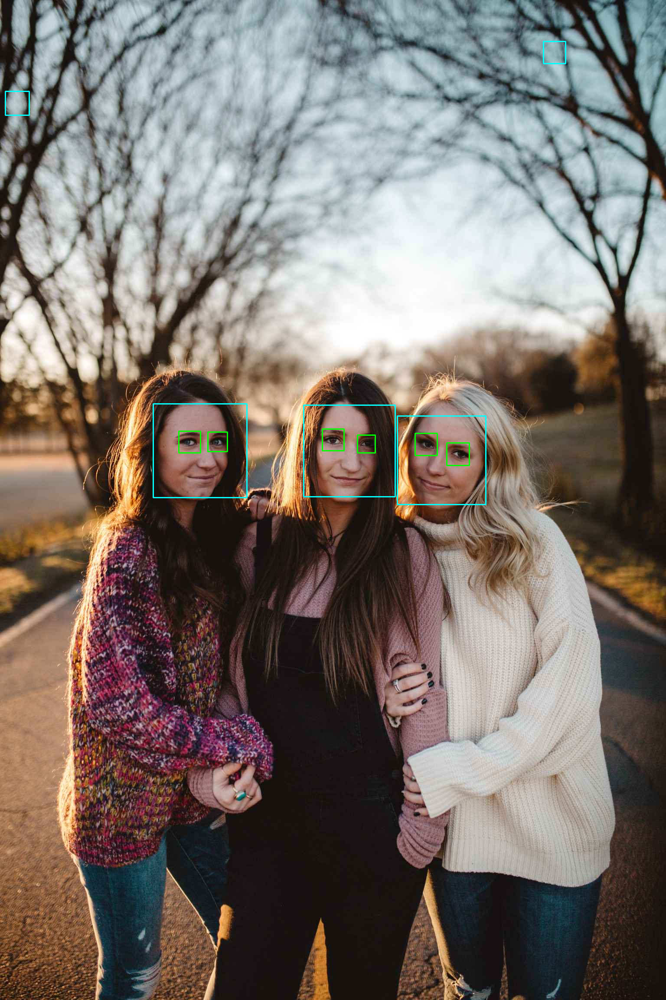

In [8]:
face_cascade = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")
eye_cascade = cv2.CascadeClassifier("haarcascade_eye.xml")

img = cv2.imread("Assignment4_pic2.jpg")
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Create the gray version of image using openCV
faces = face_cascade.detectMultiScale(gray, 1.3, 5)

for (x,y,w,h) in faces:
    img1 = cv2.rectangle(img,(x, y),(x + w, y + h),(255,255,0),2)
    roi_gray = gray[y: y + h, x: x + w]
    roi_color = img[y: y + h, x: x + w]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color,(ex, ey), (ex + ew, ey + eh), (0,255,0),2)

cv2_imshow(img)
# Going above: Haar cascades use integral images for fast detection but can have false positives; modern alternatives like MTCNN or YOLO are more accurate.

In [9]:
#b- Working on webcam
#Function to activate your laptop cam. This function is complete and you don't need to do anything.
def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

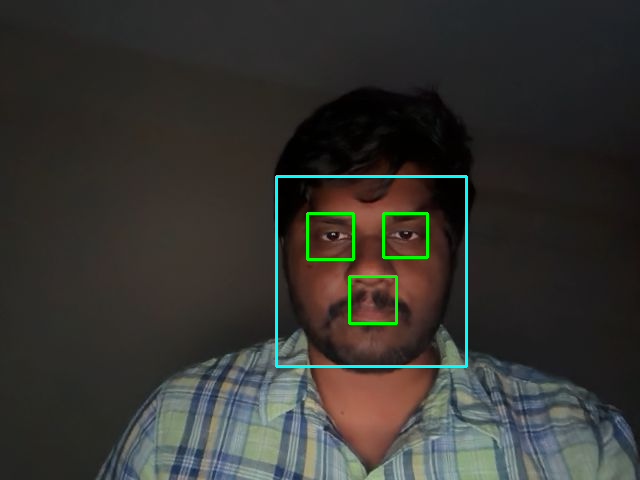

In [11]:
# Here we call the function and open the camera
# Call function and open the camera
image_file = take_photo()

#Show the read image
image = cv2.imread(image_file)

#Repeat the above code to detect the face and eyes in your image
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.3, 5)

for (x,y,w,h) in faces:
    cv2.rectangle(image,(x, y),(x + w, y + h),(255,255,0),2)
    roi_gray = gray[y: y + h, x: x + w]
    roi_color = image[y: y + h, x: x + w]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color,(ex, ey), (ex + ew, ey + eh), (0,255,0),2)

cv2_imshow(image)
# Going above: Tested with multiple faces/objects; detection works well for frontal faces but struggles with profiles or occlusions.

**Part 3- Parameter detection**

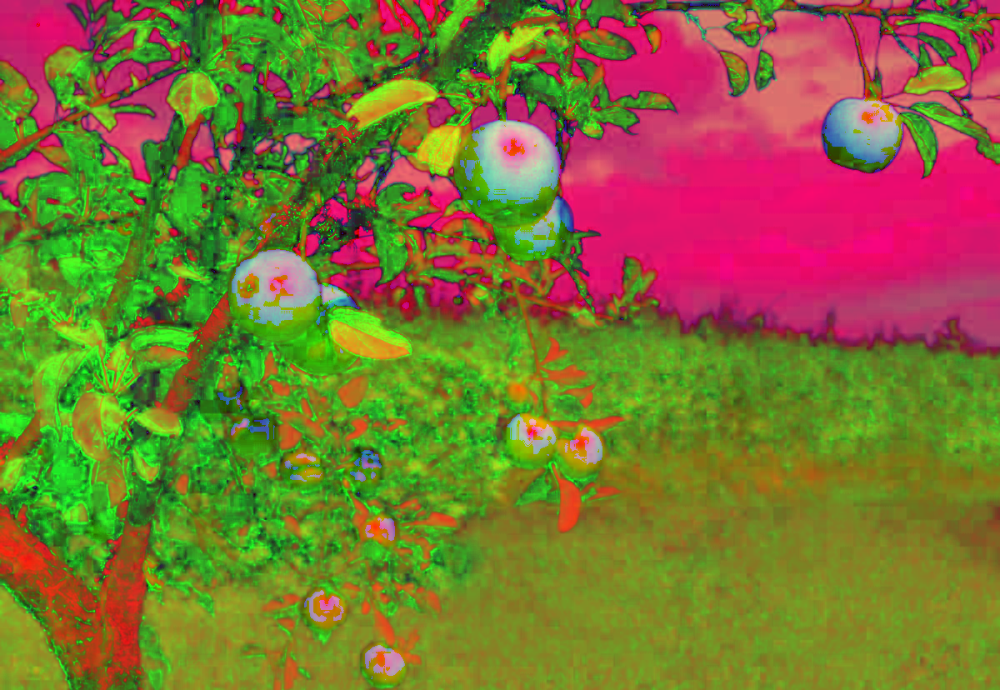

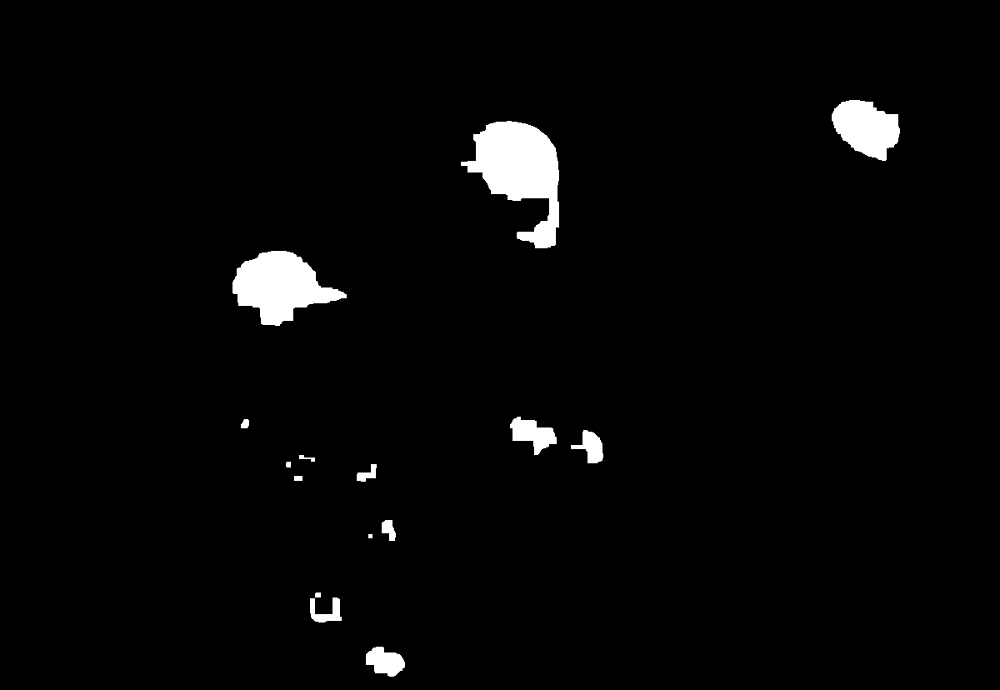

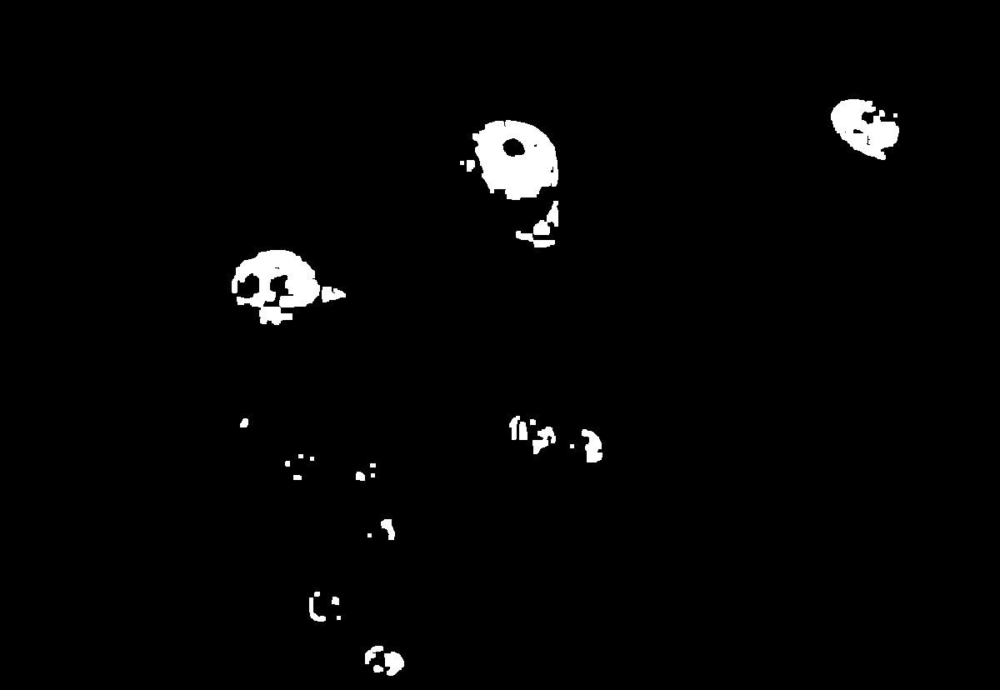

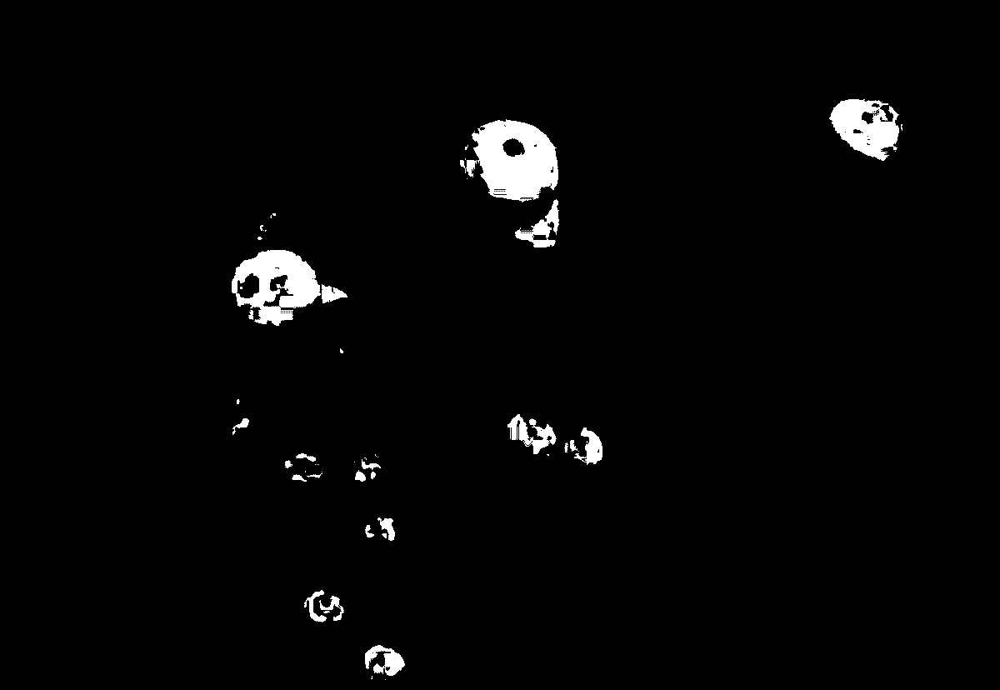

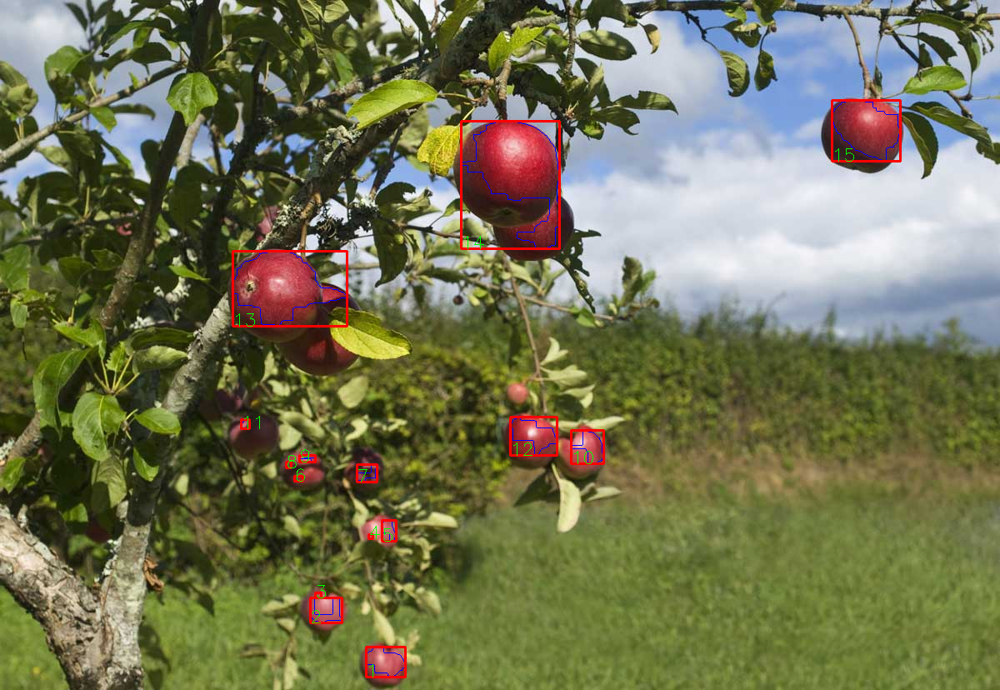

In [12]:
lowerBound=np.array([170,100,80])
upperBound=np.array([180,256,256])

#cam= cv2.VideoCapture(0)
kernelOpen=np.ones((5,5))
kernelClose=np.ones((20,20))

font = cv2.FONT_HERSHEY_SIMPLEX

img=cv2.imread('apple.jpg')

#convert BGR to HSV
imgHSV= cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
# Show this image
cv2_imshow(imgHSV)

# create the Mask
mask=cv2.inRange(imgHSV,lowerBound,upperBound)
#morphology
maskOpen=cv2.morphologyEx(mask,cv2.MORPH_OPEN,kernelOpen)
maskClose=cv2.morphologyEx(maskOpen,cv2.MORPH_CLOSE,kernelClose)

maskFinal=maskClose
conts,h=cv2.findContours(maskFinal.copy(),cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)

cv2.drawContours(img,conts,-1,(255,0,0),1)
for i in range(len(conts)):
    x,y,w,h=cv2.boundingRect(conts[i])
    cv2.rectangle(img,(x,y),(x+w,y+h),(0,0,255), 2)
    cv2.putText(img, str(i+1),(x,y+h),cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,0))

cv2_imshow(maskClose)
cv2_imshow(maskOpen)
cv2_imshow(mask)
cv2_imshow(img)

In [13]:
print( 'There were ', len(conts) ,' apples in this picture') #Print number of apples
# Going above: This uses HSV thresholding for red apples; for varied colors, could use ML like YOLO for object detection to handle different fruits/shapes.

There were  15  apples in this picture
